Image Processing with OpenCV

In [111]:
# Importing modules
import cv2
import numpy as np
import matplotlib.pyplot as plt

Function for plotting Image

In [112]:
def show(img):
    img=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    plt.imshow(img, cmap='gray')
    plt.xticks([]), plt.yticks([])  # to hide tick values on X and Y axis
    plt.show()

In [113]:
#This function will plot two images side by side
def plot_image(image_1, image_2,title_1="Orignal",title_2="New Image"):
    plt.figure(figsize=(10,10))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(image_1, cv2.COLOR_BGR2RGB))
    plt.title(title_1)
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(image_2, cv2.COLOR_BGR2RGB))
    plt.title(title_2)
    plt.show()

1. Read and Display Image

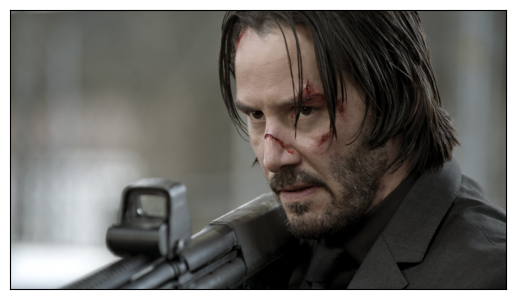

In [114]:
import cv2

jWick=cv2.imread(r"C:\Users\SHIVANSHU\Downloads\JohnWick3.jpg")
show(jWick)


In [115]:
print(jWick)

[[[130 131 129]
  [134 135 133]
  [135 136 134]
  ...
  [ 64  66  66]
  [ 67  69  69]
  [ 66  68  68]]

 [[131 132 130]
  [134 135 133]
  [133 134 132]
  ...
  [ 69  71  71]
  [ 68  70  70]
  [ 64  66  66]]

 [[131 132 130]
  [132 133 131]
  [130 131 129]
  ...
  [ 72  74  74]
  [ 68  70  70]
  [ 63  65  65]]

 ...

 [[206 196 186]
  [205 195 185]
  [203 193 183]
  ...
  [ 16  18  19]
  [ 16  18  19]
  [ 16  18  19]]

 [[205 195 185]
  [203 193 183]
  [201 191 181]
  ...
  [ 16  18  19]
  [ 16  18  19]
  [ 16  18  19]]

 [[204 194 184]
  [201 191 181]
  [199 189 179]
  ...
  [ 16  18  19]
  [ 17  19  20]
  [ 16  18  19]]]


In [116]:
# Checkin the Type of Image
print("Type of image is {}".format(type(jWick)))

Type of image is <class 'numpy.ndarray'>


In [117]:
print(len(jWick))

2160


In [118]:
print(len(jWick[0]))

3840


In [119]:
print(len(jWick[0][0]))

3


In [120]:
#Getting the Shape of the array from shape attribute

print("Dimension for image is {}".format(jWick.shape))

Dimension for image is (2160, 3840, 3)


In [121]:
print(jWick.dtype)

uint8


In [122]:
print(jWick.size)

24883200


In [123]:
#Getting the Maximum Intensity Value
jWick.max()

np.uint8(255)

In [124]:
#Getting the Minimum Intensity Value
jWick.min()

np.uint8(0)

In [125]:
length=jWick.shape[0]
width=jWick.shape[1]
channels=jWick.shape[2]

print("Length of image is {}".format(length))
print("width of image is {}".format(width))
print("No of channels is {}".format(channels))

Length of image is 2160
width of image is 3840
No of channels is 3


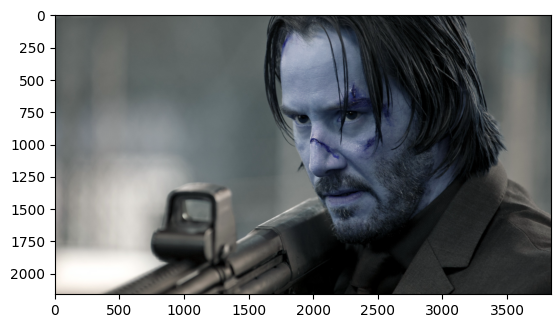

In [126]:
#Changing the order of RGB Channels

jWick=cv2.imread(r"C:\Users\SHIVANSHU\Downloads\JohnWick3.jpg")
plt.imshow(jWick)
plt.show()

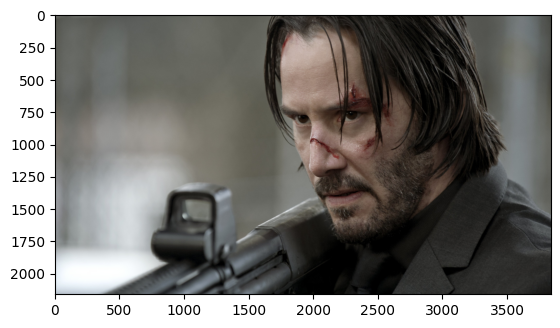

In [127]:
#Changing colour space with conversion code

new_image=cv2.cvtColor(jWick, cv2.COLOR_BGR2RGB)

plt.imshow(new_image)
plt.show()

GrayScale Images

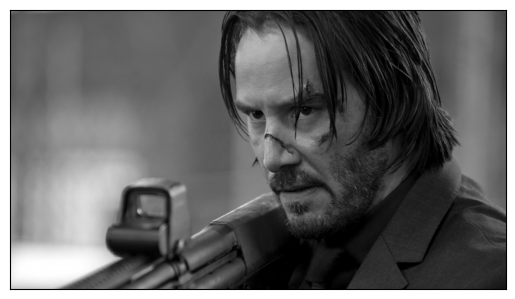

In [128]:
# get grayscale image
def get_grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

image_gray = get_grayscale(new_image)
show(image_gray)

In [129]:
image_gray.shape # Image array has only 2 dimensions

(2160, 3840)

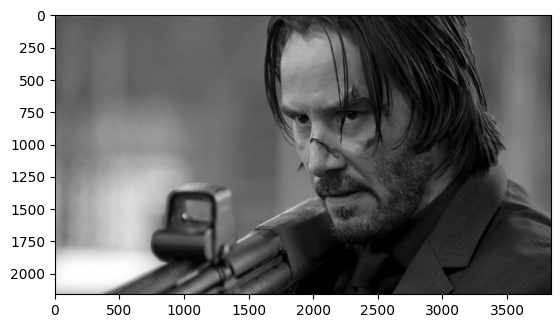

In [130]:
#Plotting Image using imshow
plt.imshow(image_gray, cmap='gray')
plt.show()


2. Indexing

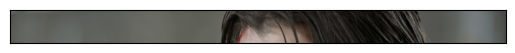

In [131]:
#Numpy Slicing

rows = 256
show(jWick[0:rows, :, :])

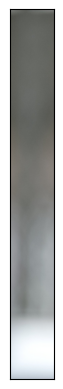

In [132]:
columns = 256
show(jWick[:,0:columns,:])

In [133]:
"""
Cropping image where following
Start Row (y1)                         
Start Column(x1)                            
End row(y1+h)                            
End columns(x1+w)
"""
##################################
"""
def crop_np(image):
    y=375
    x=300
    h=425
    w=645
    
    cropped_img=image[y:y+h, x:x+w]  ## ROI Extraction from Image
    
    return cropped_img
"""

def cropping(image):
    height, width = image.shape[:2]

    # Let's get the starting pixel coordiantes (top  left of cropping rectangle)
    start_row, start_col = int(height * .31), int(width * 0.17)

    # Let's get the ending pixel coordinates (bottom right)
    end_row, end_col = int(height * .99), int(width * .94)

    # Simply use indexing to crop out the rectangle we desire
    cropped = image[start_row:end_row , start_col:end_col]
    
    return cropped


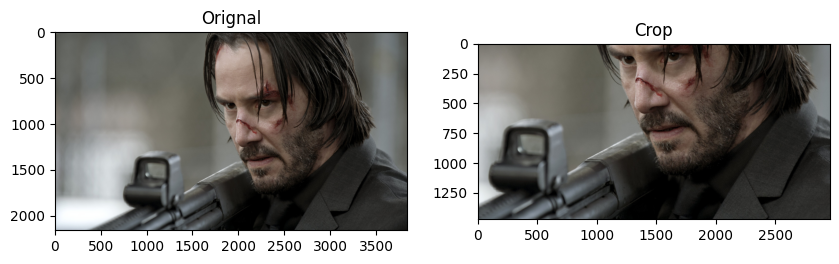

In [134]:
crop_image=cropping(jWick)
plot_image(jWick, crop_image, title_2='Crop')

3. Types of colour Spaces

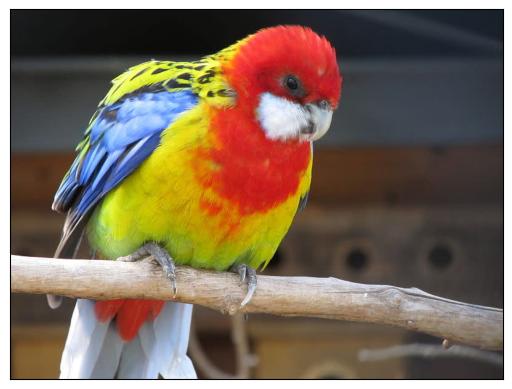

In [135]:
bird=cv2.imread(r"C:\Users\SHIVANSHU\Downloads\bird.jpg")
show(bird)

In [136]:
#Converting BGR color space into RGB color space
rgb_image = cv2.cvtColor(bird, cv2.COLOR_BGR2RGB)

RGB Colour Space

In [137]:
image_r=rgb_image.copy()
image_g=rgb_image.copy()
image_b=rgb_image.copy()

In [138]:
# making R channel zero
#making G channel zero
image_b[:, :, :2]=0   #For Blue Colour Channel

In [139]:
# making B channel zero
#making G channel zero
image_r[:, :, 1:]=0   #For Red Colour Channel

In [140]:
# making R channel zero
#making B channel zero
image_g[:, :, [0, 2]]=0  #For Green Colour Channel

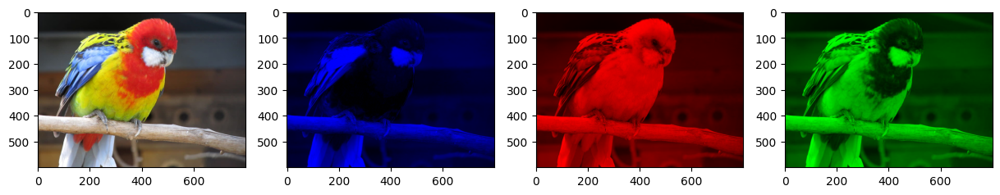

In [141]:
f, axes = plt.subplots(1, 4, figsize = (15,15))
images= [bird, image_b, image_r, image_g]

i = 0
for ax in axes:
    if i==0:
        ax.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
        
    else:
        ax.imshow(images[i])
    i+=1

HVS Colour Space

In [142]:
#Converting BGR color space into HSV color space
hsv_image = cv2.cvtColor(bird, cv2.COLOR_RGB2HSV)

In [143]:
hue_image=hsv_image.copy()
saturation_image=hsv_image.copy()
value_image=hsv_image.copy()

In [144]:
# For hue
hue_image[:,:,1:] = 0

In [145]:
#For Saturationn
saturation_image[:,:,[0, 2]] = 0

In [146]:
#For Value
value_image[:,:, :2] = 0

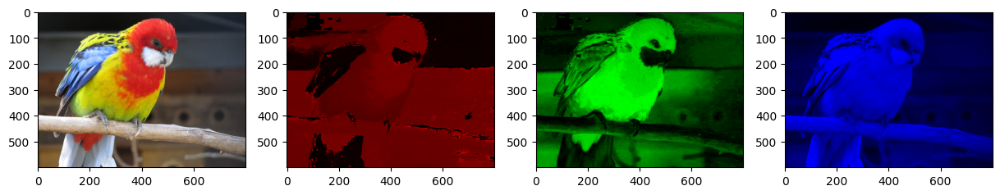

In [147]:
f, axes = plt.subplots(1, 4, figsize = (15,15))
images= [bird, hue_image, saturation_image, value_image]

i = 0
for ax in axes:
    if i==0:
        ax.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
        
    else:
        ax.imshow(images[i])
    i+=1

Copying Images

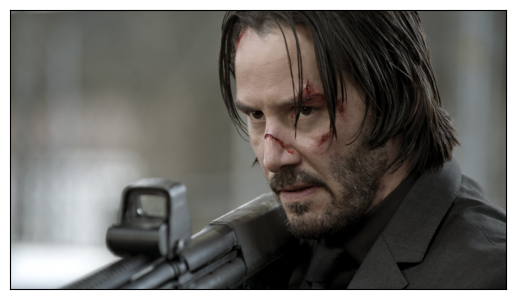

In [148]:
A = jWick.copy()
show(A)

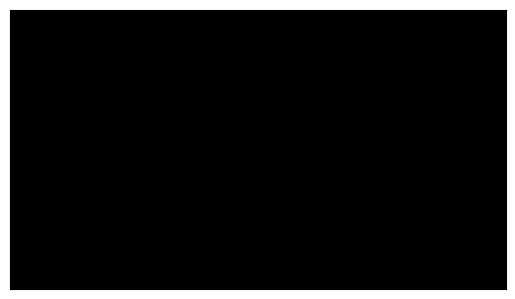

In [149]:
B = A
A[:,:,:] = 0
show(B)

4. Manipulating Images

In [150]:
#Flipping Images

width, height, C=jWick.shape
print('width, height, C',width, height, C)

width, height, C 2160 3840 3


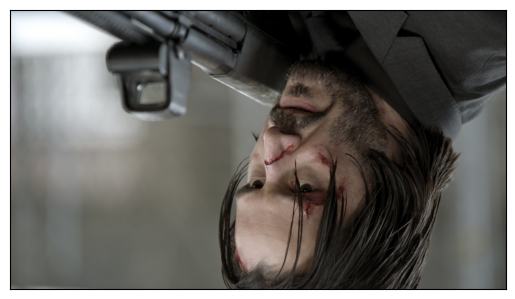

In [151]:
array_flip = np.zeros((width, height,C),dtype=np.uint8)

for i,row in enumerate(jWick):
        array_flip[width-1-i,:,:]=row

show(array_flip)

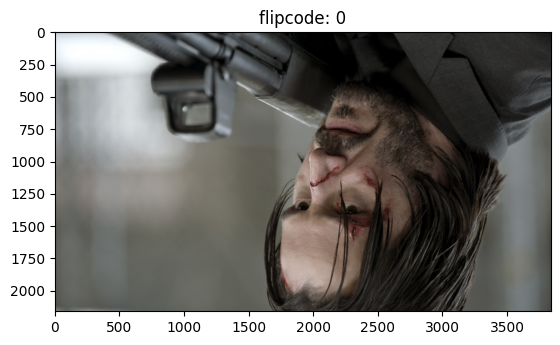

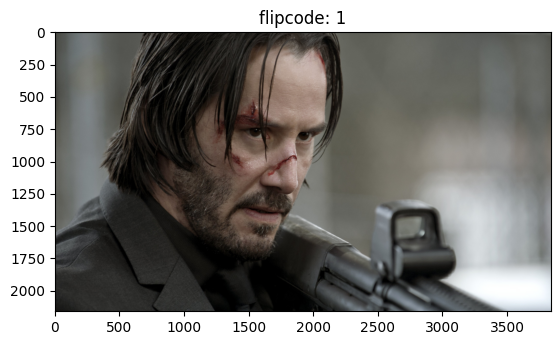

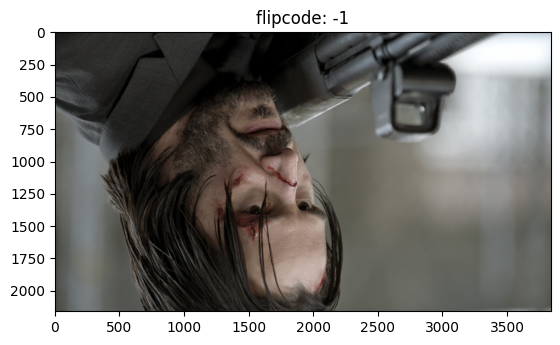

In [152]:
#Using Flipcode

for flipcode in [0,1,-1]:
    im_flip =  cv2.flip(jWick,flipcode )
    plt.imshow(cv2.cvtColor(im_flip,cv2.COLOR_BGR2RGB))
    plt.title("flipcode: "+str(flipcode))
    plt.show()


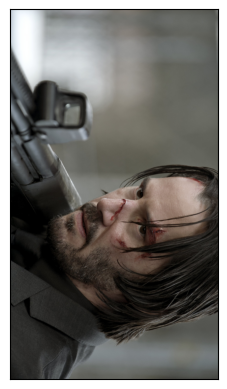

In [153]:
#Using Rotate() Function

im_flip = cv2.rotate(jWick, 0)
show(im_flip)

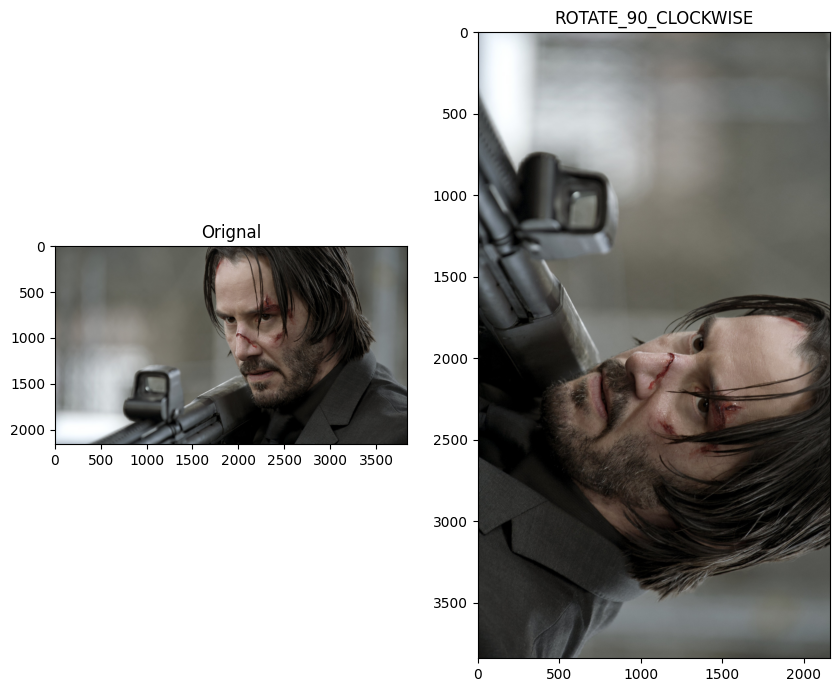

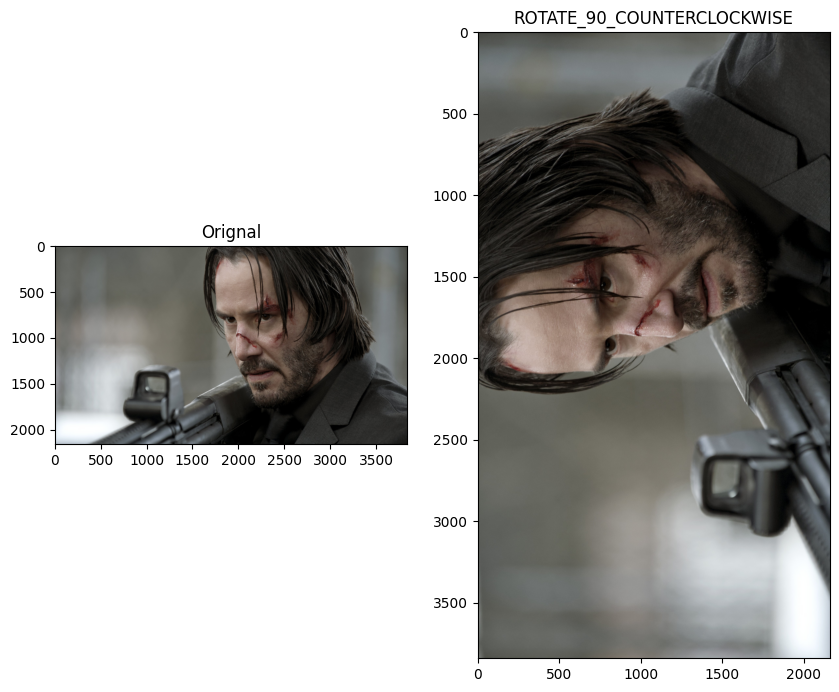

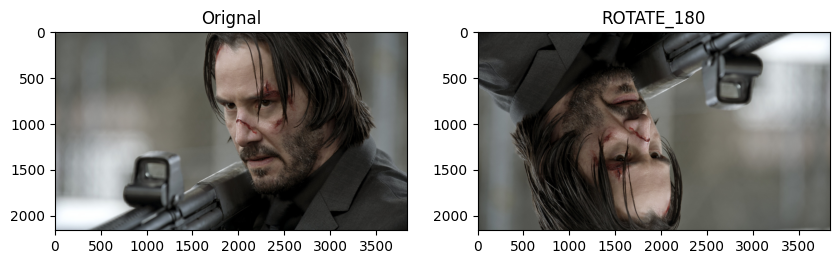

In [154]:
#Using Built in Attributes

flip = {"ROTATE_90_CLOCKWISE":cv2.ROTATE_90_CLOCKWISE,"ROTATE_90_COUNTERCLOCKWISE":cv2.ROTATE_90_COUNTERCLOCKWISE,"ROTATE_180":cv2.ROTATE_180}

for key, value in flip.items():
    
    plot_image(jWick, cv2.rotate(jWick,value), title_2=key)

5. Image Smoothing

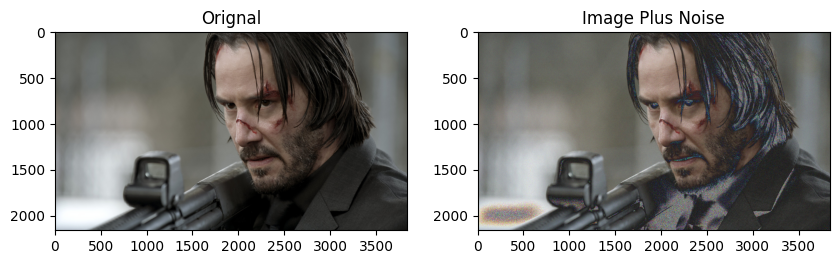

In [155]:
# Get the number of rows and columns in the image
rows, cols,_= jWick.shape
# Creates values using a normal distribution with a mean of 0 and standard deviation of 15, the values are converted to unit8 which means the values are between 0 and 255
noise = np.random.normal(0,15,(rows,cols,3)).astype(np.uint8)
# Add the noise to the image
noisy_image = jWick + noise
# Plots the original image and the image with noise using the function defined at the top
plot_image(jWick, noisy_image, title_1="Orignal",title_2="Image Plus Noise")

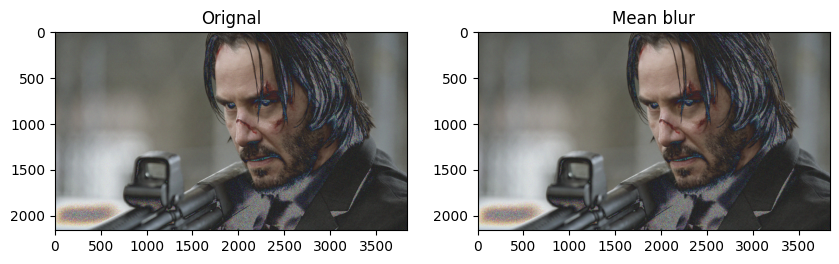

In [156]:
#Noice Removal by Mean Filter

def mean_blur(img, kernel=(5, 5)):
    blur = cv2.blur(img, kernel)
    
    return blur

image_mean=mean_blur(noisy_image, (5, 5))

plot_image(noisy_image, image_mean, title_2='Mean blur')


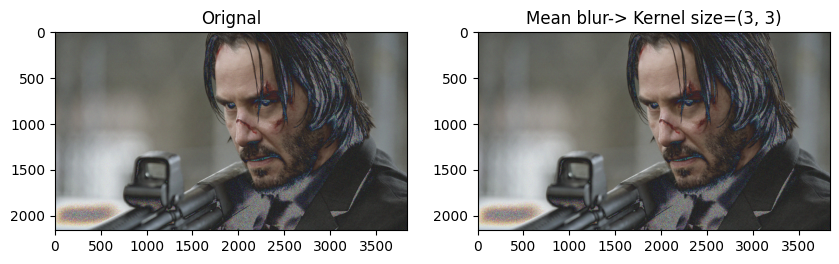

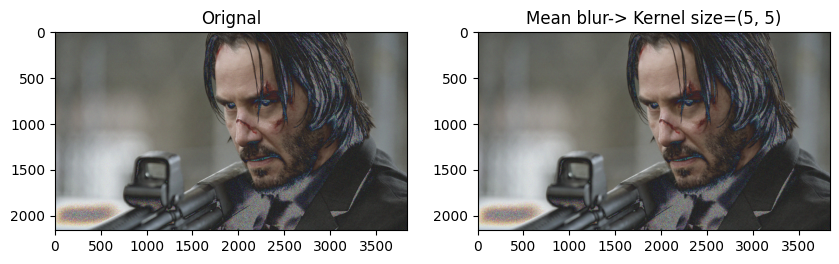

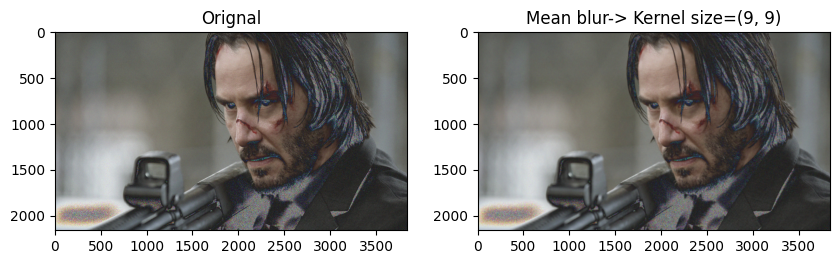

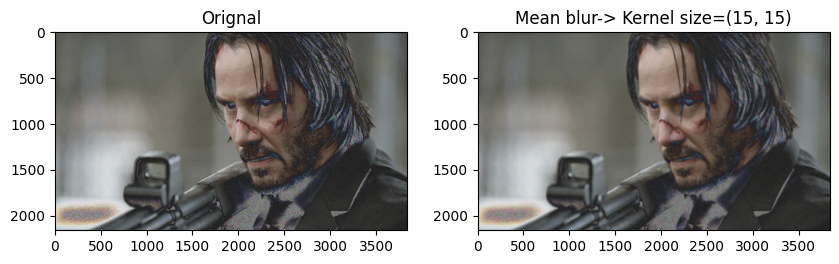

In [157]:
kernel_sizes = [(3, 3), (5, 5), (9, 9), (15, 15)]

for kX, kY in kernel_sizes:
    image_mean=mean_blur(noisy_image, (kX, kY))

    plot_image(noisy_image, image_mean, title_2=f'Mean blur-> Kernel size=({kX}, {kY})')

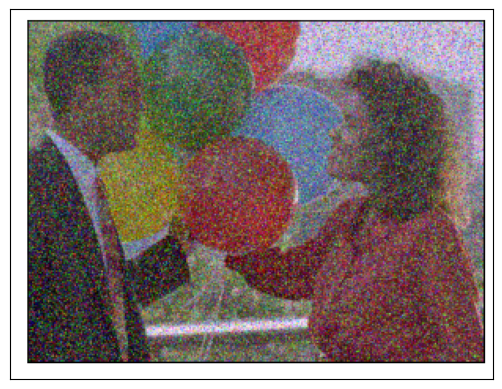

In [159]:
#Noice Removal by Median Filter

def median_blur(image, ksize = 9):
    return cv2.medianBlur(image, ksize)

balloons=cv2.imread(r'C:\Users\SHIVANSHU\Downloads\med-blur.png')
show(balloons)

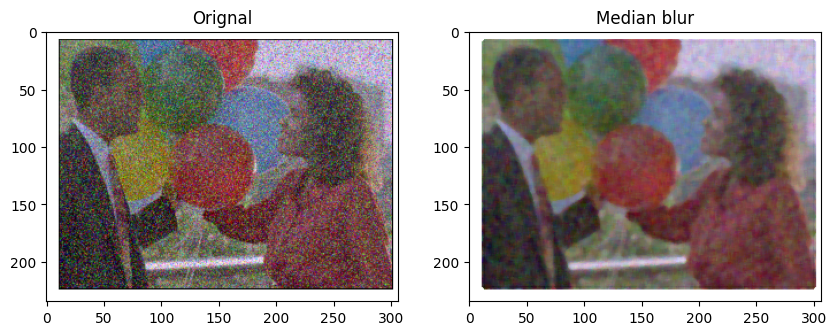

In [160]:
image_med=median_blur(balloons, 5)

plot_image(balloons, image_med, title_2='Median blur')

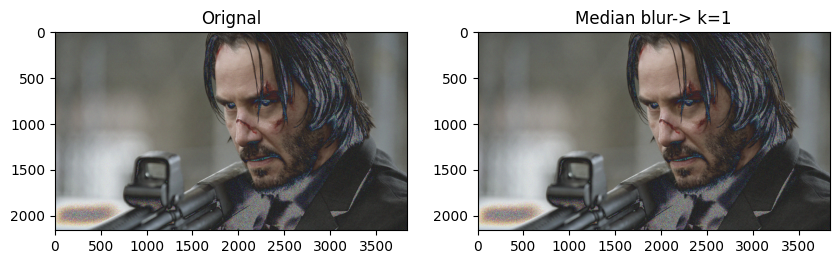

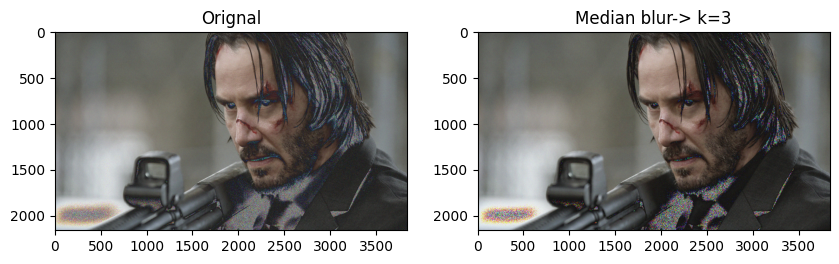

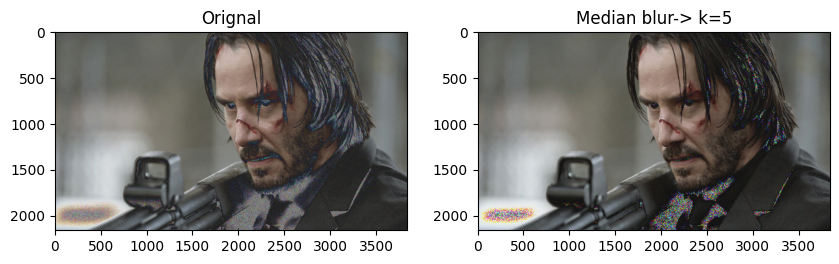

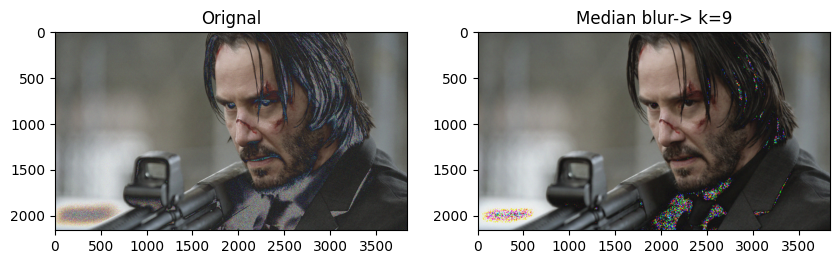

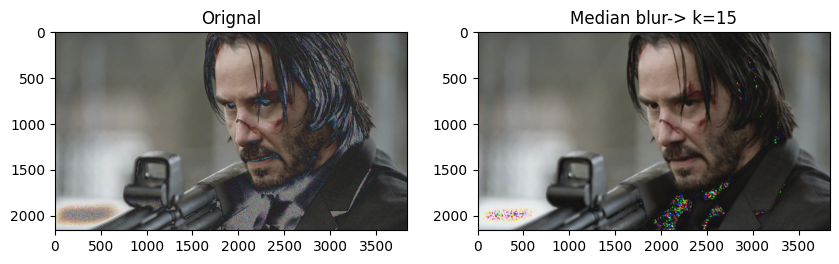

In [162]:
for k in (1, 3, 5, 9, 15):
    
    image_med=median_blur(noisy_image, k)

    plot_image(noisy_image, image_med, title_2=f'Median blur-> k={k}')

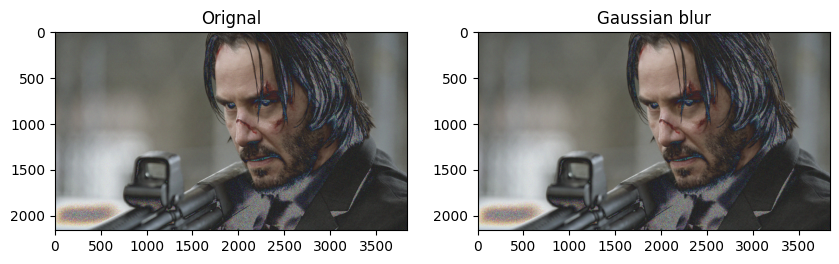

In [163]:
#Noice Reduction by Gaussian Filter

def gaussian_blur(img, kernel=(3, 3), sigmaX=0, sigmaY=0):
    return cv2.GaussianBlur(img, kernel, sigmaX, sigmaY)

# Filters the images using GaussianBlur on the image with noise using a 4 by 4 kernel 
image_filtered=gaussian_blur(noisy_image, (5, 5), 4, 4)
plot_image(noisy_image, image_filtered, title_2='Gaussian blur')

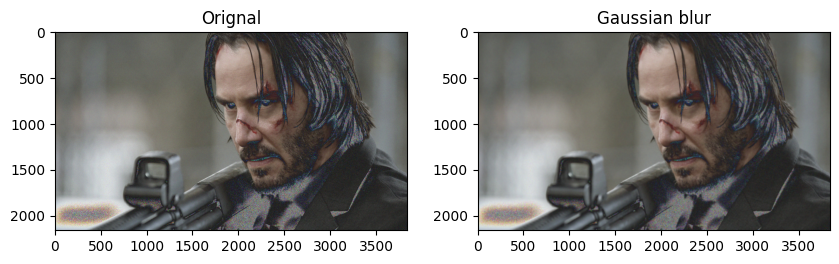

In [164]:
# Filters the images using GaussianBlur on the image with noise using a 11 by 11 kernel 
image_filtered=gaussian_blur(noisy_image, (11, 11), 10, 10)
plot_image(noisy_image, image_filtered, title_2='Gaussian blur')

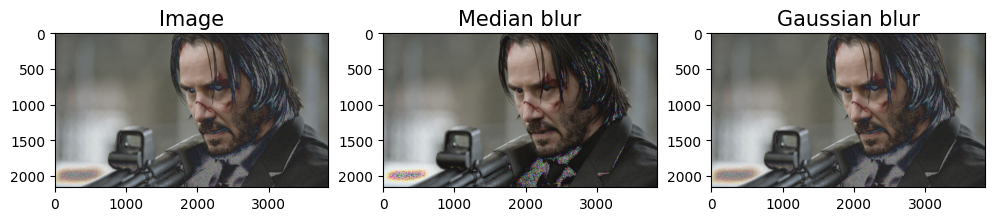

In [165]:
image_med=median_blur(noisy_image, 5)
image_gaus=gaussian_blur(noisy_image, (5, 5), 4, 4)

fig, (ax1, ax2, ax3) = plt.subplots( 1, 3, figsize=(12, 8))

ax1.imshow(cv2.cvtColor(noisy_image, cv2.COLOR_BGR2RGB))
ax1.set_title('Image', size=15)

ax2.imshow(cv2.cvtColor(image_med, cv2.COLOR_BGR2RGB))
ax2.set_title('Median blur', size=15)

ax3.imshow(cv2.cvtColor(image_gaus, cv2.COLOR_BGR2RGB))
ax3.set_title('Gaussian blur', size=15)
plt.show()

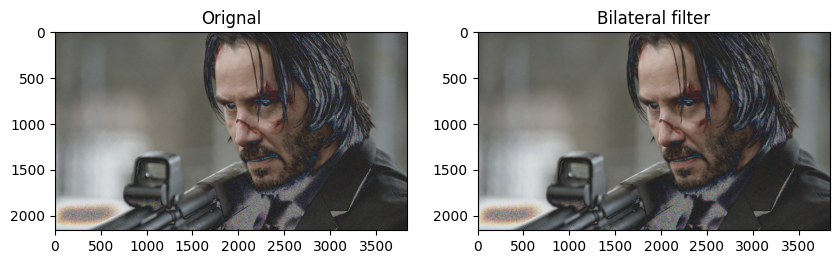

In [166]:
#Noice Reduction by Bilateral Filter

def bilateral(image, diameter=9, sigmaColor=75, sigmaSpace=75):
    return cv2.bilateralFilter(image, diameter, sigmaColor, sigmaSpace)

image_bilateral=bilateral(noisy_image, 9, 350, 350)

plot_image(noisy_image, image_bilateral, title_2='Bilateral filter')

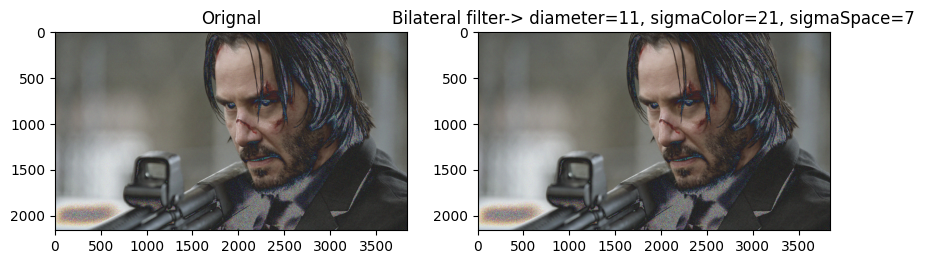

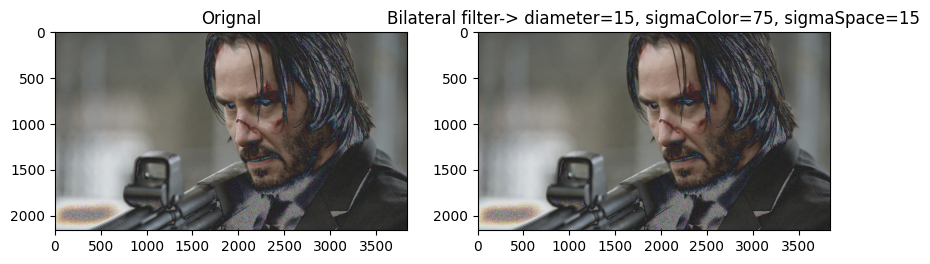

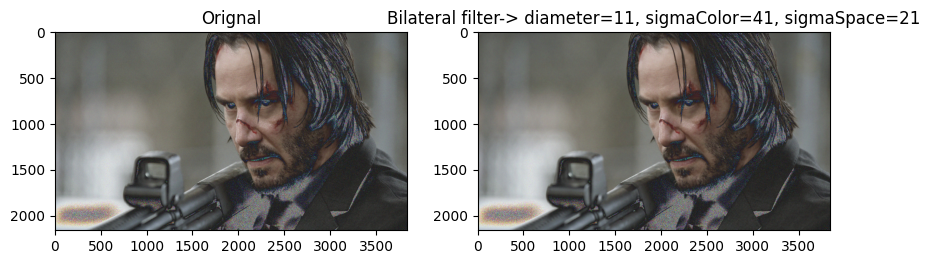

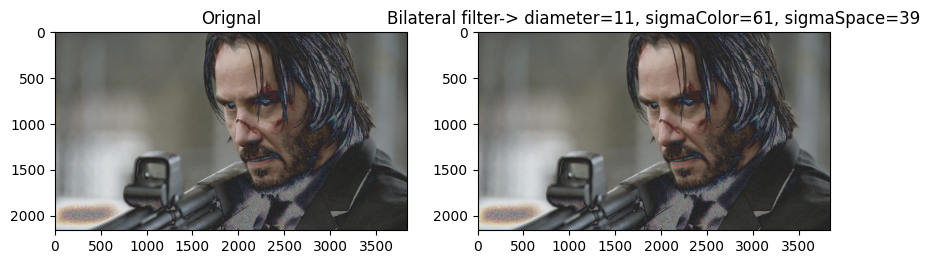

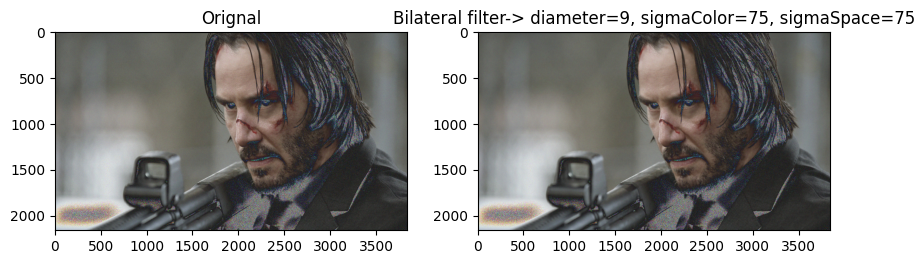

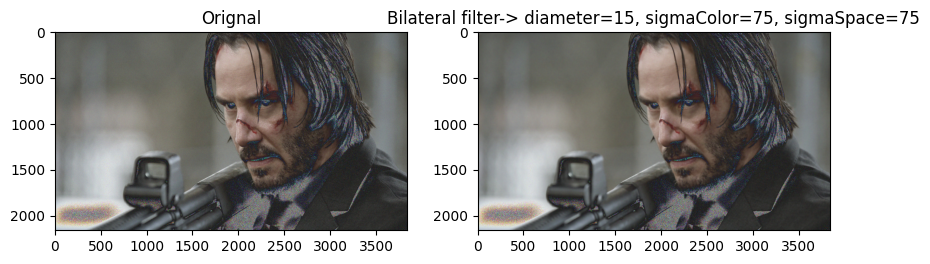

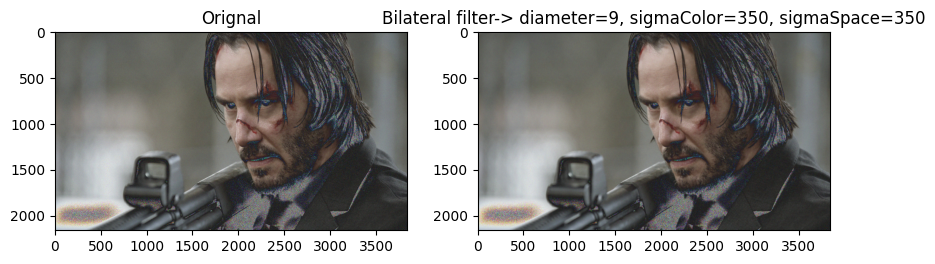

In [167]:
params = [(11, 21, 7), (15, 75, 15), (11, 41, 21), (11, 61, 39), 
          (9, 75, 75), (15, 75, 75), (9, 350, 350)]

for (d, s_c, s_s) in params:
    
    image_bilateral=bilateral(noisy_image, d, s_c, s_s)

    plot_image(noisy_image, image_bilateral, title_2=f'Bilateral filter-> diameter={d}, sigmaColor={s_c}, sigmaSpace={s_s}')